In [1]:
import os
import shutil

folders = [
    '/kaggle/input/output-split-0',
    '/kaggle/input/output-split-1',
    '/kaggle/input/outputs-split-2',
    '/kaggle/input/output-split-3',
    '/kaggle/input/sp-split-4',
]

def extract_accuracy(s):
    return int(s[-7:-3])

def copy_files(src_folder, dest_folder):
    model_files = [f for f in os.listdir(src_folder) if f.endswith('.pt')]
    model_files.sort(key=extract_accuracy)
    best_model = model_files[-1]
    split = best_model[17]
    new_name = f'final_best_model-{split}.pth'
    src_file = os.path.join(src_folder, best_model)
    dest_file = os.path.join(dest_folder, best_model)
    new_file = os.path.join(dest_folder, new_name)
    shutil.copy(src_file, dest_file)
    os.rename(dest_file, new_file)
    print(src_file, new_file)

    diagrams = [f for f in os.listdir(src_folder) if f.endswith('.png')]
    for diagram in diagrams:
        src_diagram = os.path.join(src_folder, diagram)
        dest_diagram = os.path.join(dest_folder, diagram)
        shutil.copy(src_diagram, dest_diagram)
        print(dest_diagram)


dest_folder = '/kaggle/working/'

for folder in folders:
    copy_files(folder, dest_folder)


shutil.copy('/kaggle/input/face-data/image_paths_dataframe.csv', '/kaggle/working/image_paths_dataframe.csv')

/kaggle/input/output-split-0/model_checkpoint_0_epoch_04_acc_9850.pt /kaggle/working/final_best_model-0.pth
/kaggle/working/training_accuracy_plot-0.png
/kaggle/working/validation_accuracy_plot-0.png
/kaggle/working/training_loss_plot-0.png
/kaggle/working/validation_loss_plot-0.png
/kaggle/input/output-split-1/model_checkpoint_1_epoch_07_acc_9860.pt /kaggle/working/final_best_model-1.pth
/kaggle/working/training_accuracy_plot-1.png
/kaggle/working/validation_accuracy_plot-1.png
/kaggle/working/training_loss_plot-1.png
/kaggle/working/validation_loss_plot-1.png
/kaggle/input/outputs-split-2/model_checkpoint_2_epoch_09_acc_9860.pt /kaggle/working/final_best_model-2.pth
/kaggle/working/training_loss_plot-2.png
/kaggle/working/training_accuracy_plot-2.png
/kaggle/working/validation_loss_plot-2.png
/kaggle/working/validation_accuracy_plot-2.png
/kaggle/input/output-split-3/model_checkpoint_3_epoch_07_acc_9850.pt /kaggle/working/final_best_model-3.pth
/kaggle/working/validation_accuracy_plo

'/kaggle/working/image_paths_dataframe.csv'

Downloading: "https://download.pytorch.org/models/efficientnet_b4_rwightman-23ab8bcd.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b4_rwightman-23ab8bcd.pth
100%|██████████| 74.5M/74.5M [00:00<00:00, 235MB/s]


Testing model 0:   0%|          | 0/96 [00:00<?, ?it/s]

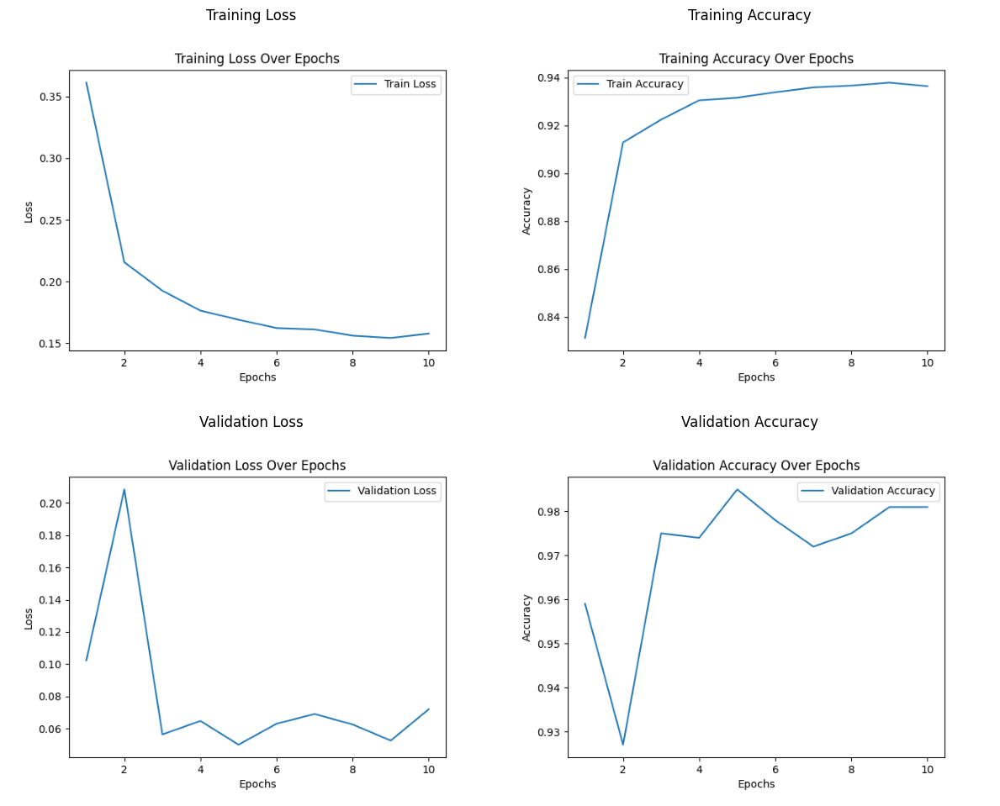

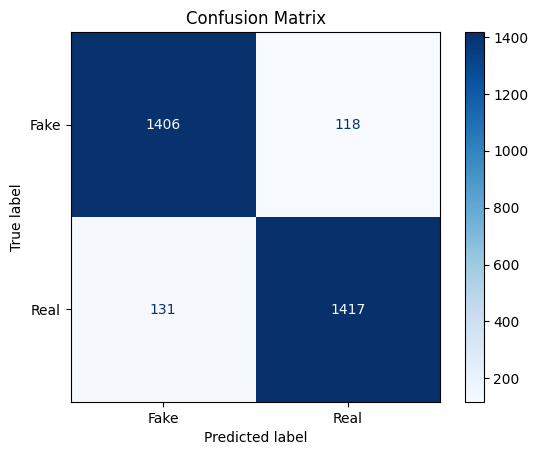

Test accuracy:  0.9189453125
Test loss:  0.24321317005281648


Testing model 1:   0%|          | 0/96 [00:00<?, ?it/s]

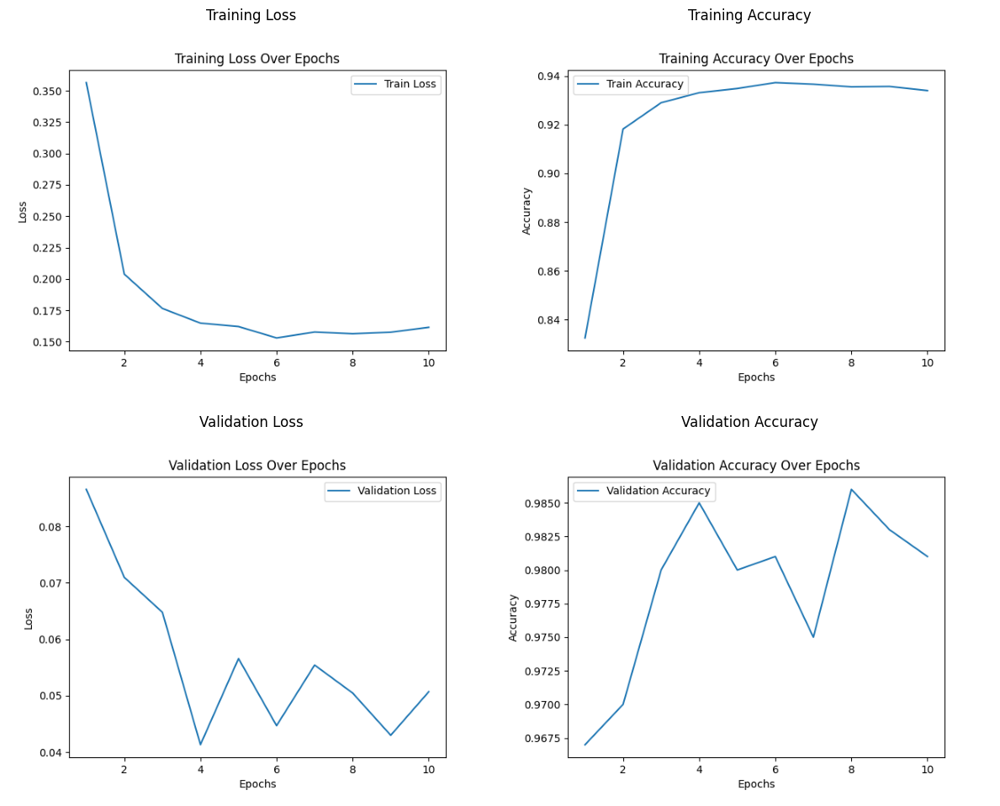

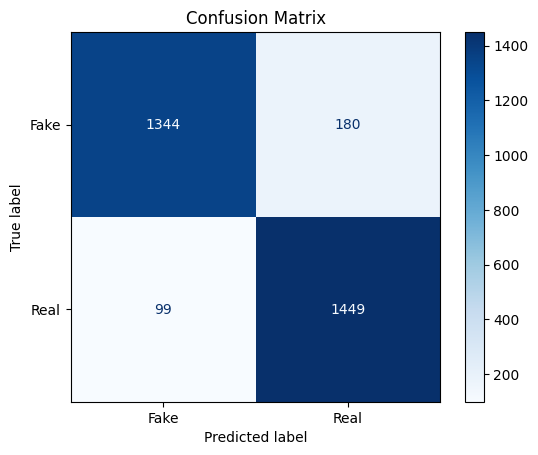

Test accuracy:  0.9091796875
Test loss:  0.26725559363452095


Testing model 2:   0%|          | 0/96 [00:00<?, ?it/s]

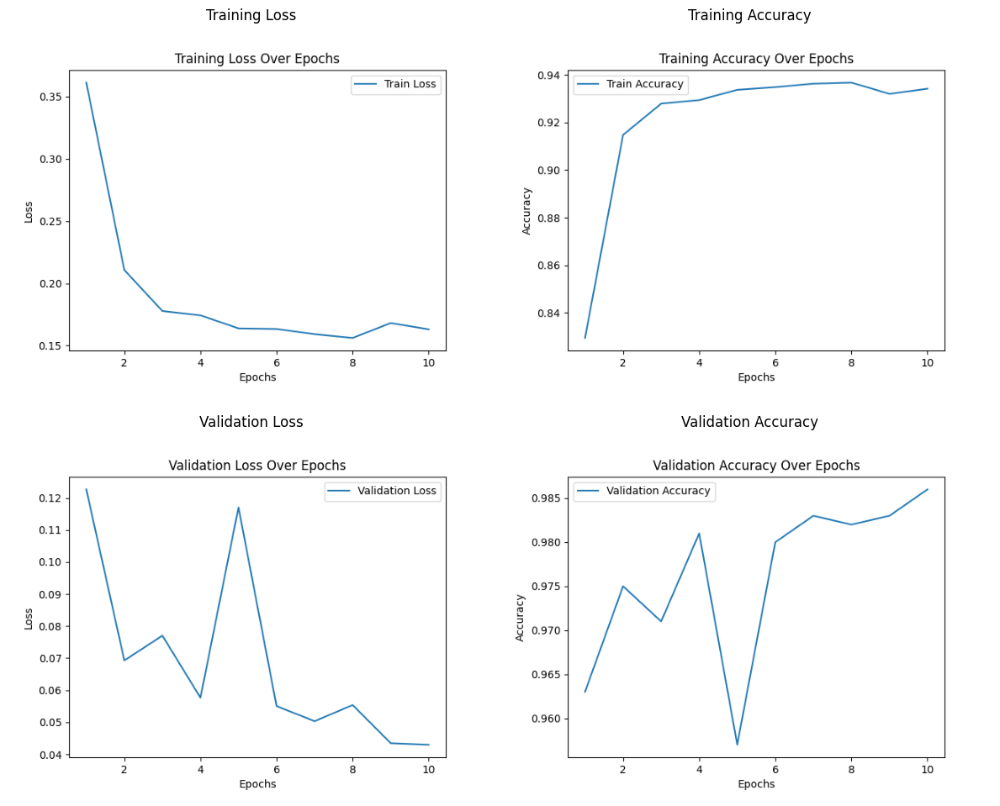

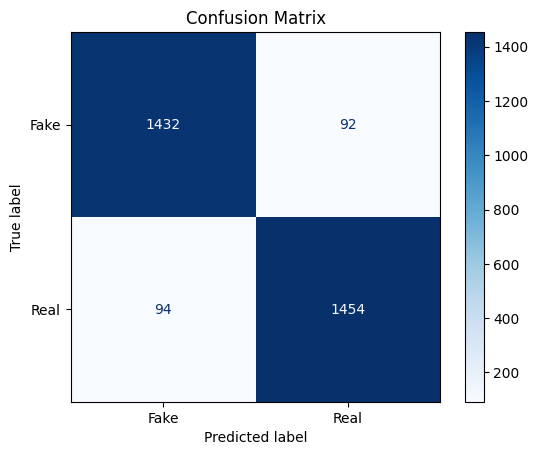

Test accuracy:  0.939453125
Test loss:  0.24519580299966037


Testing model 3:   0%|          | 0/96 [00:00<?, ?it/s]

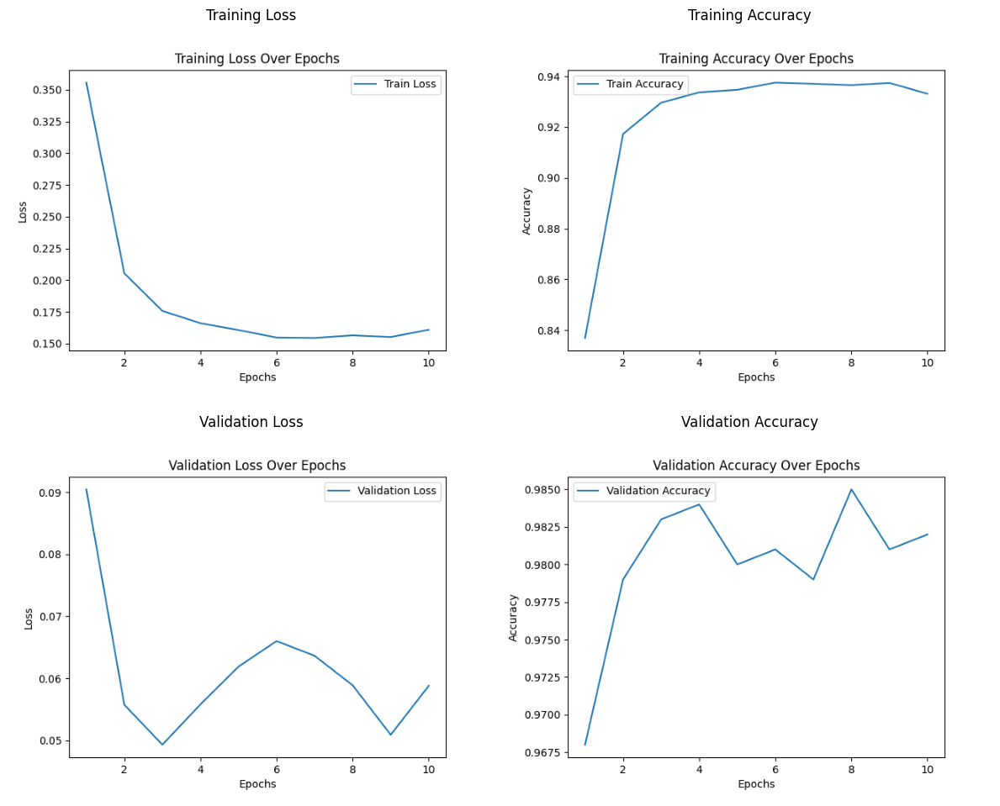

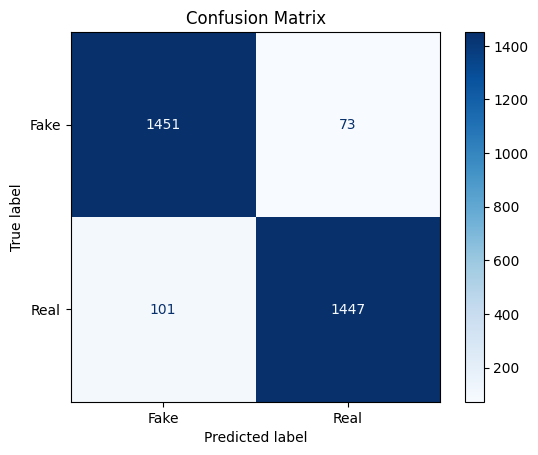

Test accuracy:  0.943359375
Test loss:  0.2062964499248968


Testing model 4:   0%|          | 0/96 [00:00<?, ?it/s]

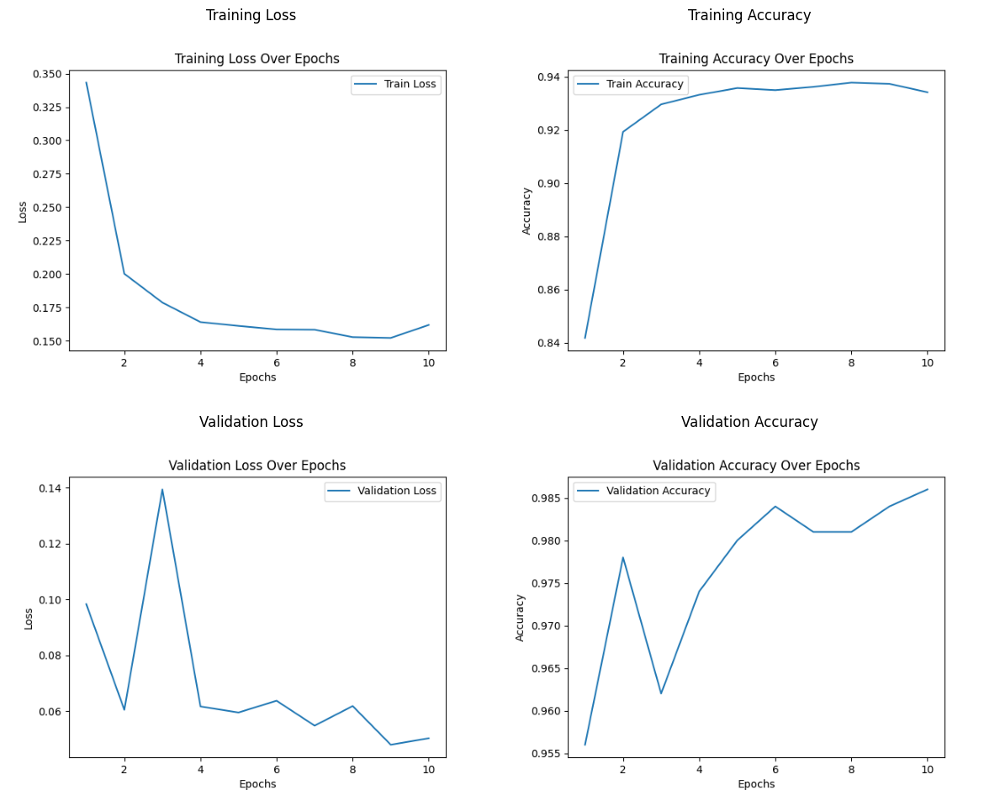

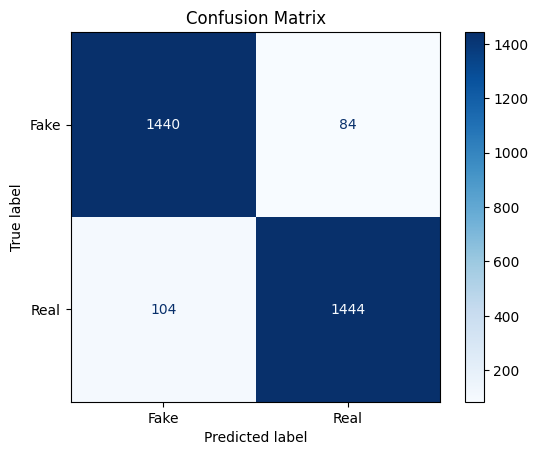

Test accuracy:  0.9388020833333334
Test loss:  0.19027009016523758


In [2]:
import warnings
warnings.simplefilter("ignore", UserWarning)
warnings.simplefilter('ignore', FutureWarning)

import os
import sys
import tempfile
import torch
import torch.distributed as dist
import torch.nn as nn
import torch.optim as optim
import torch.multiprocessing as mp
import pandas as pd
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader, random_split
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.image as mpimg
import numpy as np
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2
import random
import torch.nn.functional as F
from tqdm.notebook import tqdm
from torch.nn.parallel import DistributedDataParallel as DDP
from torch.utils.data import DataLoader, DistributedSampler


class FeatureExtractor(nn.Module):
    def __init__(self, freeze_backbone = True):
        super(FeatureExtractor, self).__init__()
        efficientnet = models.efficientnet_b4(pretrained=True)
        if freeze_backbone:
            for param in efficientnet.parameters():
                param.requires_grad = False
        self.features = efficientnet.features

    def forward(self, x, target_block=None):
        if target_block == 8:
            return self.features(x)
        layers_output = {}
        for idx, layer in enumerate(self.features):
            x = layer(x)
            layers_output[idx] = x
            # Stop processing if the target block is reached
            if target_block is not None and idx == target_block:
                break
        if target_block is None:
            target_block = 8
        return layers_output[target_block]

class Classifier(nn.Module):
    def __init__(self):
        super(Classifier, self).__init__()
        # First Convolutional Block
        self.conv1 = nn.Conv2d(1792, 1024, kernel_size=3, stride=1, padding=1)
        self.bn1 = nn.BatchNorm2d(1024)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout1 = nn.Dropout(0.25)

        # Second Convolutional Block
        self.conv2 = nn.Conv2d(1024, 512, kernel_size=3, stride=1, padding=1)
        self.bn2 = nn.BatchNorm2d(512)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout2 = nn.Dropout(0.25)

        # Third Convolutional Block
        self.conv3 = nn.Conv2d(512, 256, kernel_size=3, stride=1, padding=1)
        self.bn3 = nn.BatchNorm2d(256)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout3 = nn.Dropout(0.25)

        # Fully Connected Layers
        self.fc1 = nn.Linear(256, 128)
        self.dropout_fc = nn.Dropout(0.5)
        self.fc2 = nn.Linear(128, 1)  # Binary classification

    def forward(self, x):
        x = self.pool1(F.relu(self.bn1(self.conv1(x))))
        x = self.dropout1(x)
        x = self.pool2(F.relu(self.bn2(self.conv2(x))))
        x = self.dropout2(x)
        x = self.pool3(F.relu(self.bn3(self.conv3(x))))
        x = self.dropout3(x)
        # Flatten
        x = x.view(x.size(0), -1)
        # Fully Connected Layers
        x = F.relu(self.fc1(x))
        x = self.dropout_fc(x)
        x = torch.sigmoid(self.fc2(x))  # Sigmoid for binary classification
        return x

class DeepFakeClassifier(nn.Module):
    def __init__(self, texture_layer, freeze_backbone):
        super(DeepFakeClassifier, self).__init__()
        self.feature_extractor = FeatureExtractor(freeze_backbone)
        self.classifier = Classifier()
        self.texture_layer = texture_layer

    def forward(self, x):
        x = self.feature_extractor(x, self.texture_layer)
        x = self.classifier(x)
        return x

def display_saved_plots(split):
    import matplotlib.pyplot as plt
    import matplotlib.image as mpimg
    import os

    # File paths for the saved plots
    base_path = '/kaggle/working/'
    train_loss_path = os.path.join(base_path, f'training_loss_plot-{split}.png')
    train_accuracy_path = os.path.join(base_path, f'training_accuracy_plot-{split}.png')
    val_loss_path = os.path.join(base_path, f'validation_loss_plot-{split}.png')
    val_accuracy_path = os.path.join(base_path, f'validation_accuracy_plot-{split}.png')

    # Load images
    train_loss_img = mpimg.imread(train_loss_path)
    train_accuracy_img = mpimg.imread(train_accuracy_path)
    val_loss_img = mpimg.imread(val_loss_path)
    val_accuracy_img = mpimg.imread(val_accuracy_path)

    # Display in a 2x2 grid
    plt.figure(figsize=(12, 10))

    plt.subplot(2, 2, 1)
    plt.imshow(train_loss_img)
    plt.axis('off')
    plt.title('Training Loss')

    plt.subplot(2, 2, 2)
    plt.imshow(train_accuracy_img)
    plt.axis('off')
    plt.title('Training Accuracy')

    plt.subplot(2, 2, 3)
    plt.imshow(val_loss_img)
    plt.axis('off')
    plt.title('Validation Loss')

    plt.subplot(2, 2, 4)
    plt.imshow(val_accuracy_img)
    plt.axis('off')
    plt.title('Validation Accuracy')

    plt.tight_layout()
    plt.show()


class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        row = self.dataframe.iloc[idx]
        image_path = row['image_path']
        label = row['label']
        image = Image.open(image_path).convert("RGB")
        if self.transform:
            # Convert PIL Image to NumPy array for Albumentations
            image = np.array(image)
    
            # Apply Albumentations transformations
            augmented = self.transform(image=image)
            image = augmented['image']
        return image, label, image_path

transform = A.Compose([
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ])

def test_model(model, dataloader, criterion, device, split):
    model.eval()
    total_loss = 0
    correct = 0
    total = 0
    predictions = []
    real = []
    
    with torch.no_grad():
        for images, labels, path in tqdm(dataloader, desc=f"Testing model {split}"):
            images, labels = images.to(device), labels.to(device, dtype=torch.float32)

            outputs = model(images).squeeze()
            loss = criterion(outputs, labels)

            total_loss += loss.item() * images.size(0)
            preds = (outputs > 0.5).float()
            predictions.extend(preds.cpu().numpy())
            real.extend(labels.cpu().numpy())
            correct += (preds == labels).sum().item()
            total += labels.size(0)
            del images, labels, outputs
            torch.cuda.empty_cache()
    return total_loss / total, correct / total, predictions, real

final_df = pd.read_csv('/kaggle/working/image_paths_dataframe.csv')
test_df = final_df[(final_df['train_val_test'] == 'test')]
test_dataset = CustomDataset(test_df, transform=transform)
test_loader = train_loader = torch.utils.data.DataLoader(test_dataset, batch_size=32)
texture_layer = 8
models_trained = []
device = 'cuda'
criterion = nn.BCELoss()

for split in range(5):
    final_model_path = os.path.join('/kaggle/working/', f'final_best_model-{split}.pth')
    model = DeepFakeClassifier(texture_layer, True).to(device)
    model.load_state_dict(torch.load(final_model_path, map_location=device))
    loss, acc, preds, real = test_model(model, test_loader, criterion, device, split)
    display_saved_plots(split)
    cm = confusion_matrix(real, preds)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Fake", "Real"])
    disp.plot(cmap=plt.cm.Blues)
    plt.title("Confusion Matrix")
    plt.show()
    print("Test accuracy: ", acc)
    print("Test loss: ", loss)
    models_trained.append(model)

In [3]:
# 0.1 0.1 0.2 0.4 0.2

Testing models:   0%|          | 0/96 [00:00<?, ?it/s]

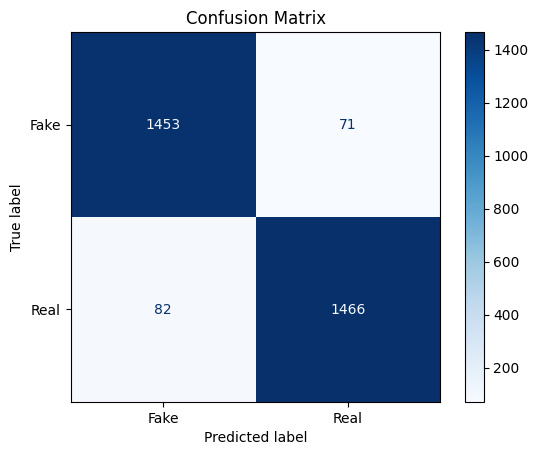

Test accuracy:  0.9501953125


In [16]:
def test_ensemble(models, dataloader, device):
    total_loss = 0
    correct = 0
    total = 0
    predictions = []
    real = []
    real_predicted_as_fake = []
    fake_predicted_as_real = []
    probabilities = {}
    with torch.no_grad():
        for images, labels, image_path in tqdm(dataloader, desc=f"Testing models"):
            images, labels = images.to(device), labels.to(device, dtype=torch.float32)
            ensembled_output = torch.zeros(labels.shape).cuda()
            weights = [0.05, 0.05, 0.2, 0.5, 0.2]
            for i in range(len(models)):
                ensembled_output += weights[i]*models[i](images).squeeze()
            # ensembled_output = ensembled_output / len(models)
            for i in range(len(image_path)):
                probabilities[os.path.basename(image_path[i])[:-4]] = f"{round(float(ensembled_output[i]),6):.6f}"
            preds = (ensembled_output > 0.5).float()
            predictions.extend(preds.cpu().numpy())
            real.extend(labels.cpu().numpy())
            correct += (preds == labels).sum().item()
            total += labels.size(0)
            for i in range(len(preds)):
                if preds[i]==1 and labels[i]==0:
                    fake_predicted_as_real.append(image_path[i])
                elif preds[i]==0 and labels[i]==1:
                    real_predicted_as_fake.append(image_path[i])
            del images, labels, ensembled_output
            torch.cuda.empty_cache()
    return correct / total, predictions, real, real_predicted_as_fake, fake_predicted_as_real, probabilities

acc, preds, real, real_predicted_as_fake, fake_predicted_as_real, probs = test_ensemble(models_trained, test_loader, device)
cm = confusion_matrix(real, preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Fake", "Real"])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.show()
print("Test accuracy: ", acc)

In [17]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def display_images(image_paths, save_name, num_images_per_row = 6):
    # Create a figure with subplots
    fig, axes = plt.subplots(len(image_paths) // num_images_per_row, num_images_per_row, figsize=(15, 15))
    
    # Loop through the image paths and display each image
    for i, image_path in enumerate(image_paths):
        row = i // num_images_per_row
        col = i % num_images_per_row
        img = mpimg.imread(image_path)
        axes[row, col].imshow(img)
        axes[row, col].axis('off')  # Hide the axes
    
    plt.tight_layout()
    plt.show()
    plt.savefig(save_name, format='png')

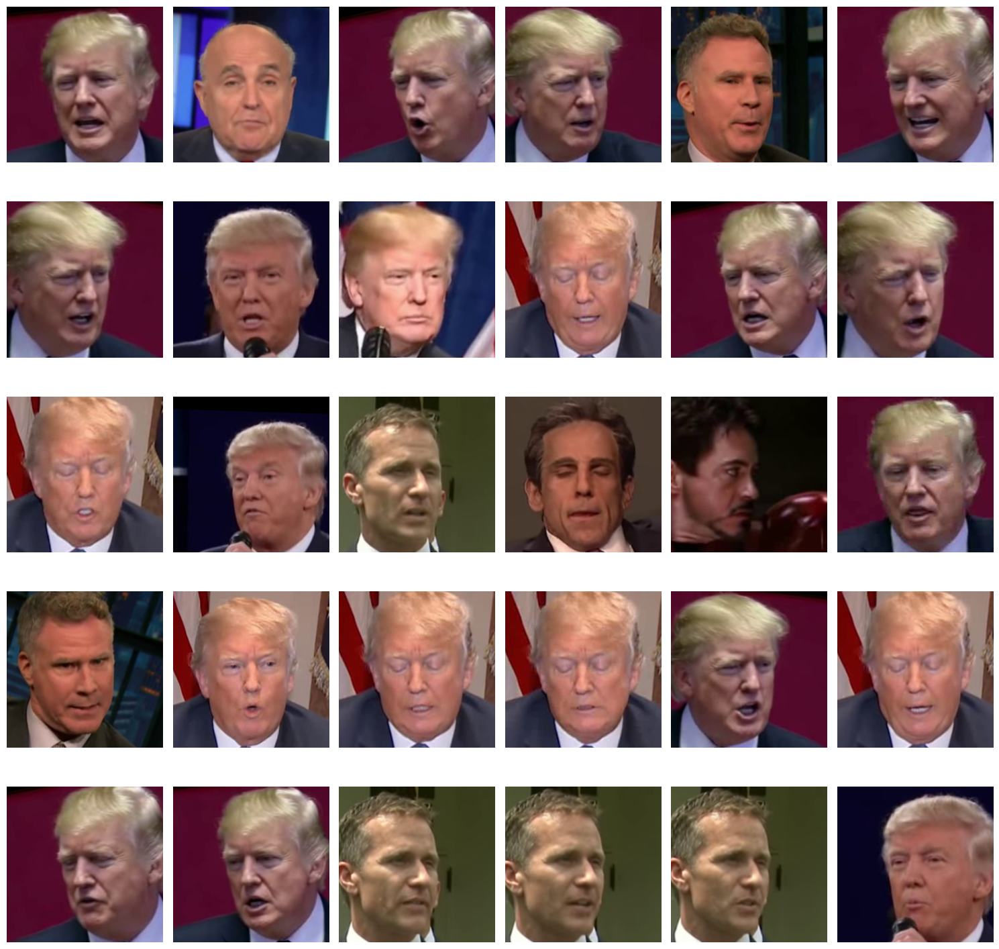

<Figure size 640x480 with 0 Axes>

In [18]:
display_images(real_predicted_as_fake[30:60], 'real_predicted_as_fake_1.png')

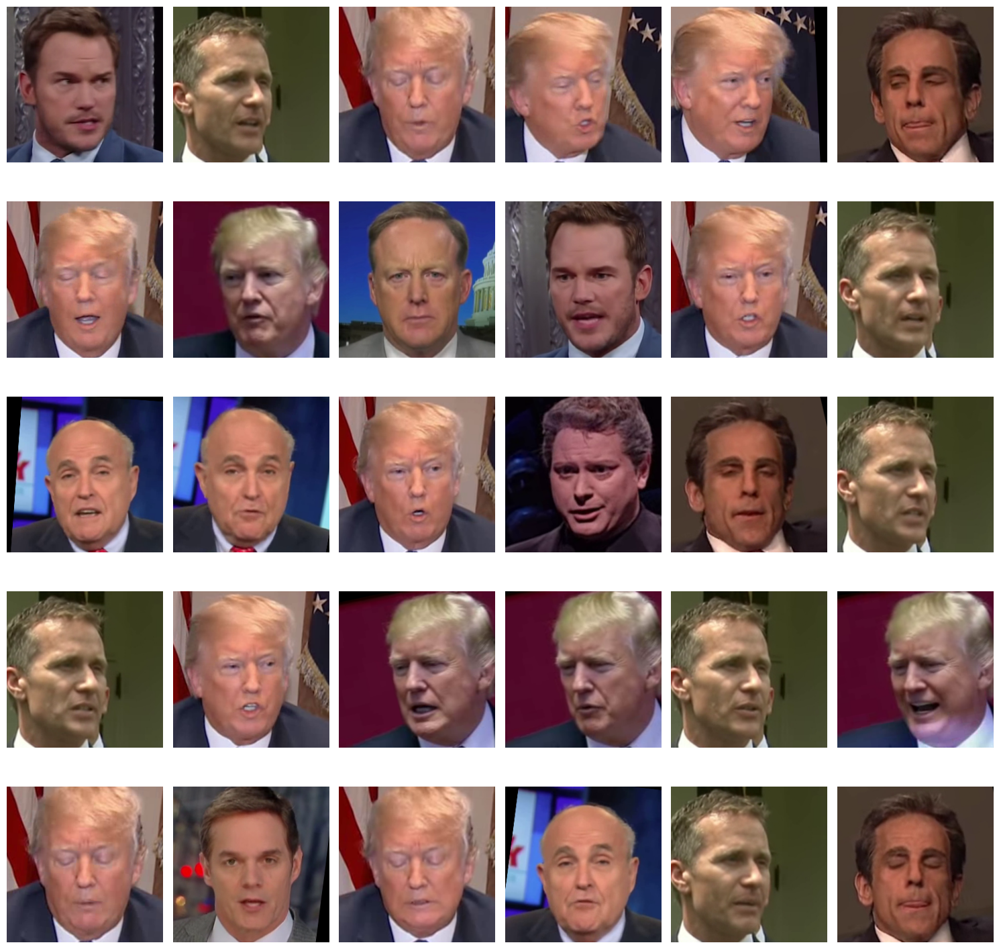

<Figure size 640x480 with 0 Axes>

In [19]:
display_images(real_predicted_as_fake[:30], 'real_predicted_as_fake_2.png')

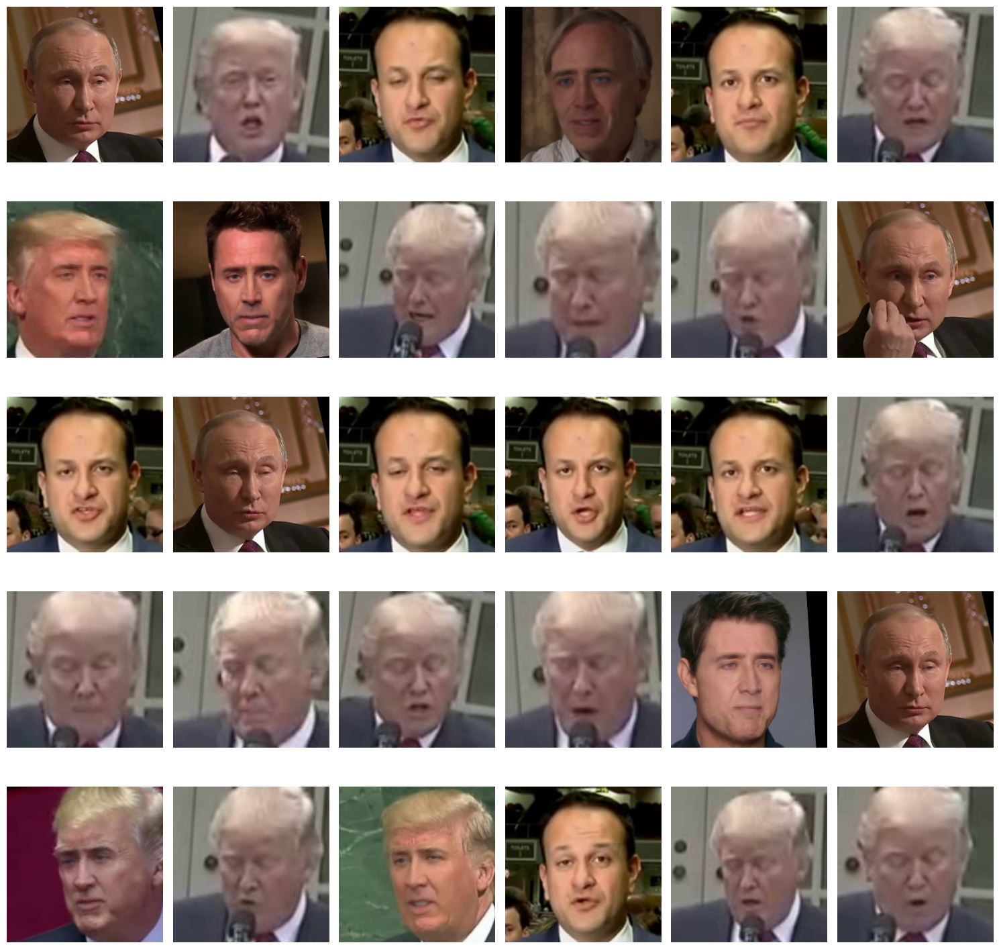

<Figure size 640x480 with 0 Axes>

In [20]:
display_images(fake_predicted_as_real[:30], 'fake_predicted_as_real_1.png')

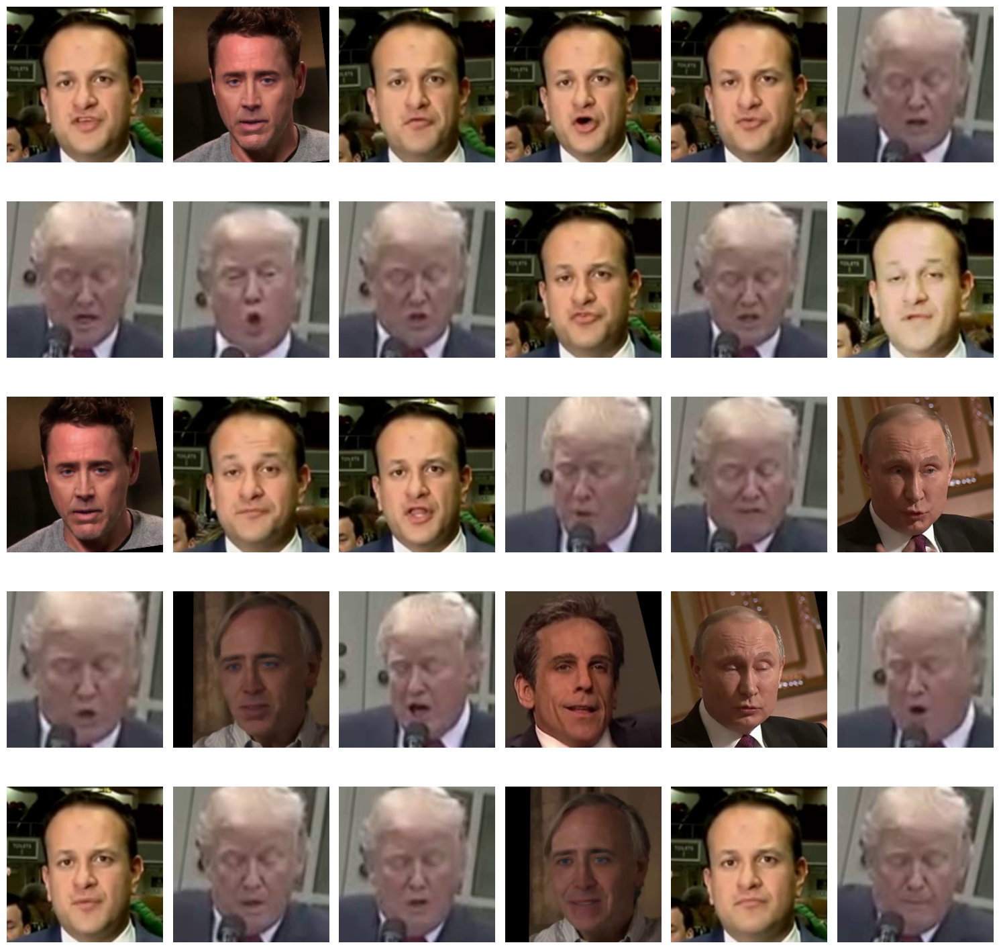

<Figure size 640x480 with 0 Axes>

In [21]:
display_images(fake_predicted_as_real[30:60], 'fake_predicted_as_real_2.png')

In [25]:
# Sort the dictionary by keys
sorted_data = dict(sorted(probs.items()))

# Write to a text file
with open("output.txt", "w") as file:
    for key, value in sorted_data.items():
        file.write(f"{key}\t{value}\n")
